In [53]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import numpy as np
import csv
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, facecolor='white')

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
attr                20.1.0
backcall            0.2.0
cffi                1.14.2
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
future_fstrings     NA
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.8.2
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
jsonschema          3.2.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
leidenalg           0.8.1
llvmlite            0.34.0
louvain             0.7.0
markupsafe          1.1.1
matplotlib          3.3.1
mpl_toolkits        NA
natsort             7.0.1
nbformat            5.0.7
numba               0.51.0
numexpr             2.7.1
numpy               1.19.1
packaging           20.4
pandas

In [54]:
batch_corrected_umap = sc.read('/scratch/batch_corrected_umap.h5ad')
uncorrected_umap = sc.read('/scratch/uncorrected_umap.h5ad')

# Batch-corrected UMAP

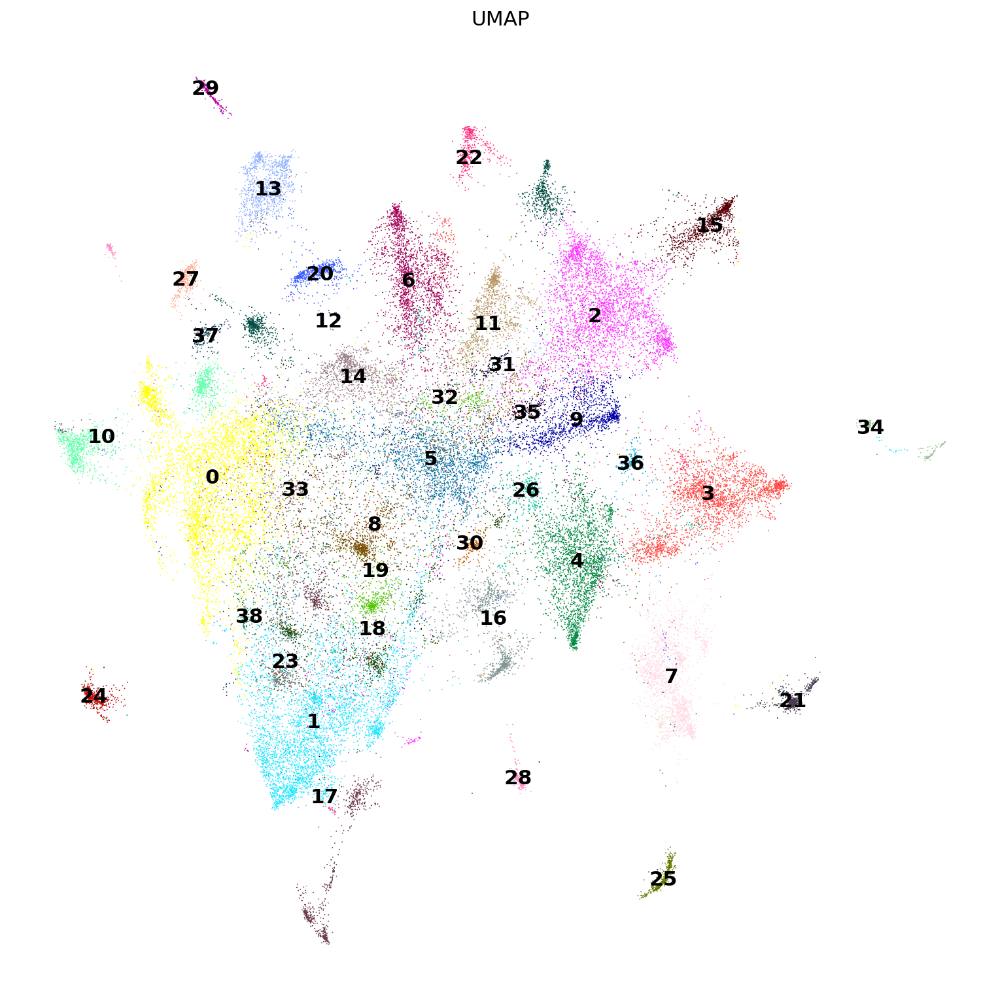

In [55]:
fig, ax = plt.subplots(figsize=(12,12))
sc.pl.umap(batch_corrected_umap, color='leiden', title='UMAP', legend_loc='on data',frameon=False,ax=ax)

# Uncorrected UMAP

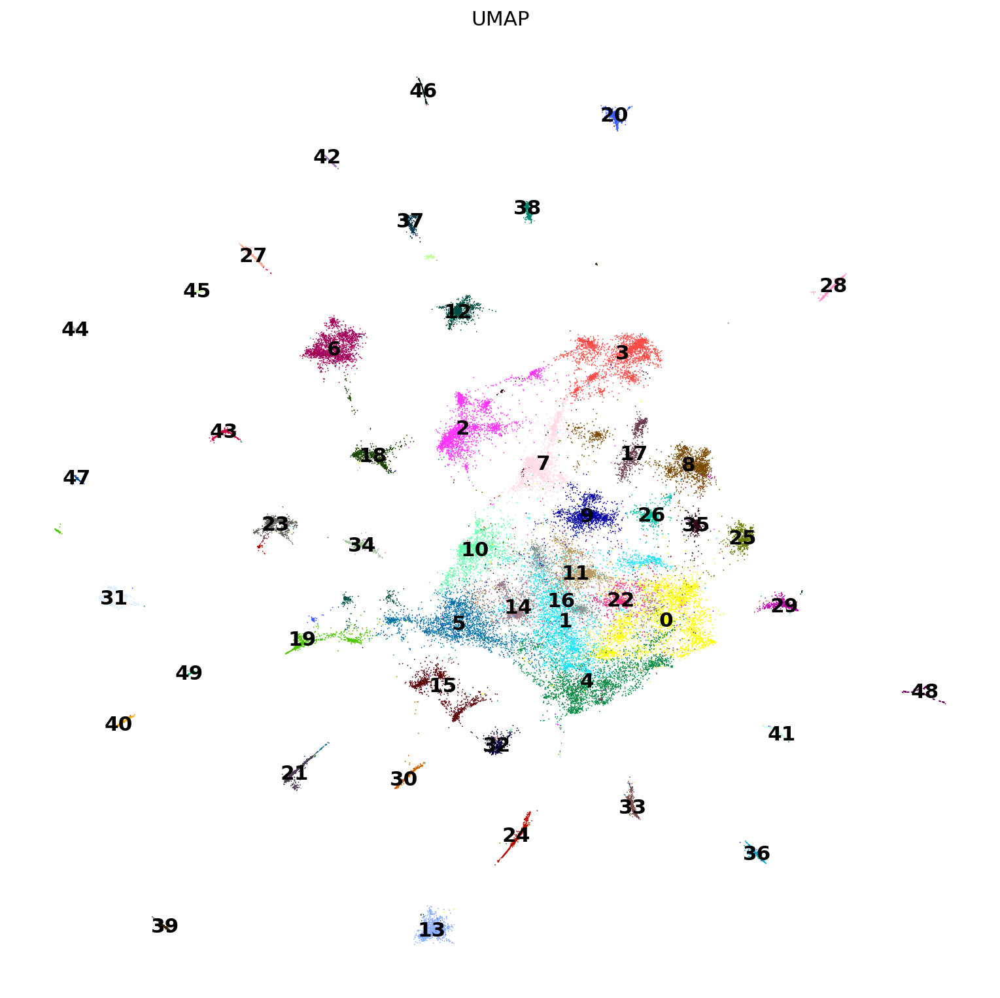

In [56]:
fig, ax = plt.subplots(figsize=(12,12))
sc.pl.umap(uncorrected_umap, color='leiden', title='UMAP', legend_loc='on data',frameon=False,ax=ax)

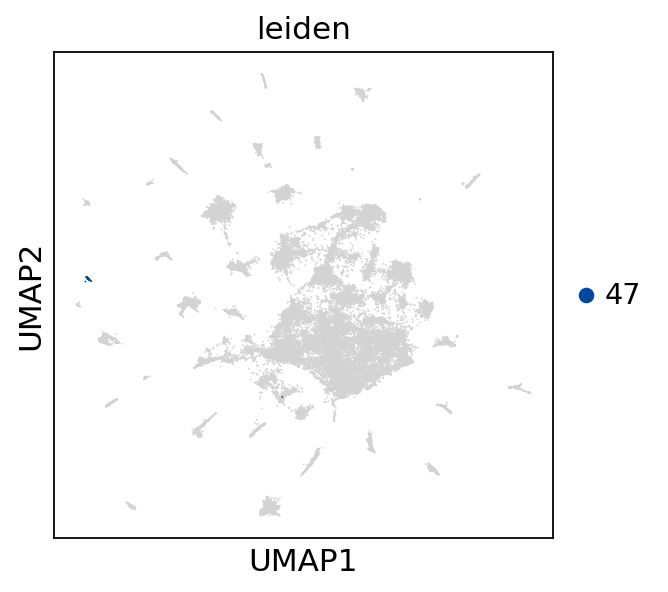

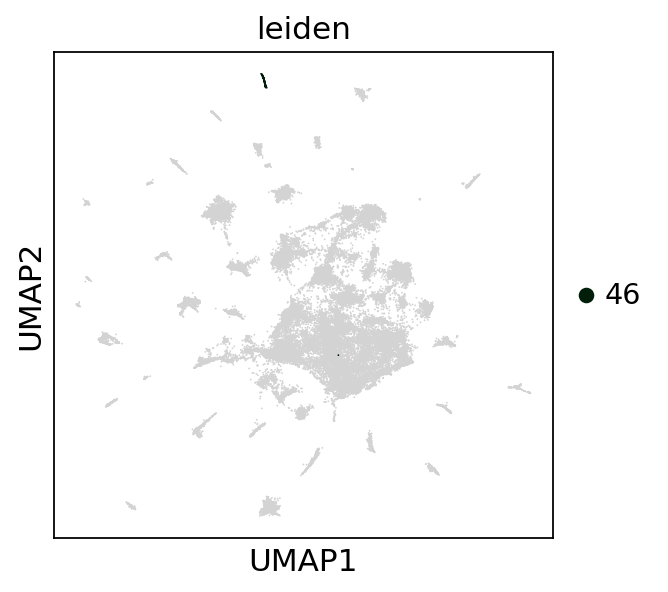

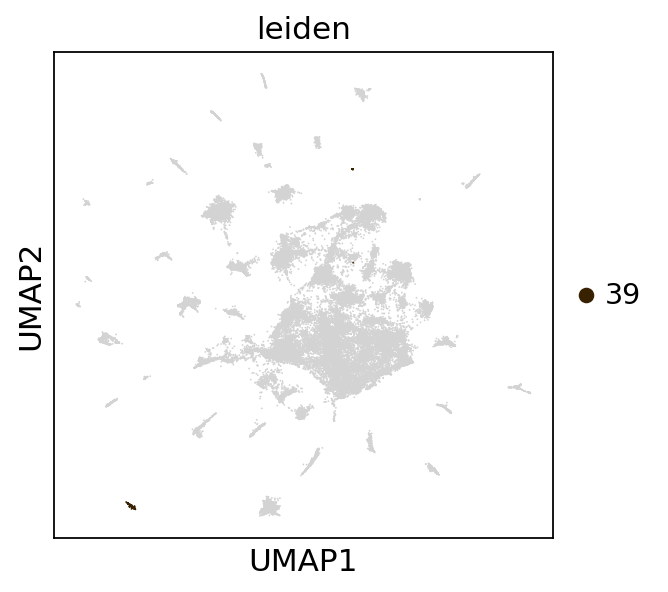

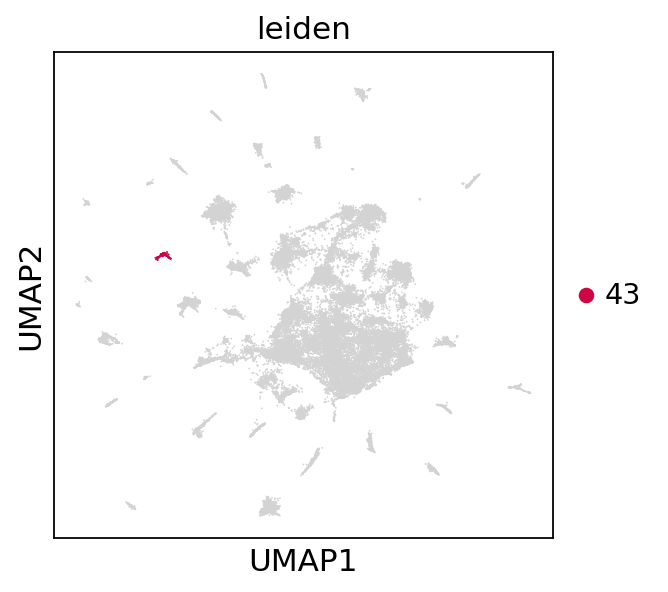

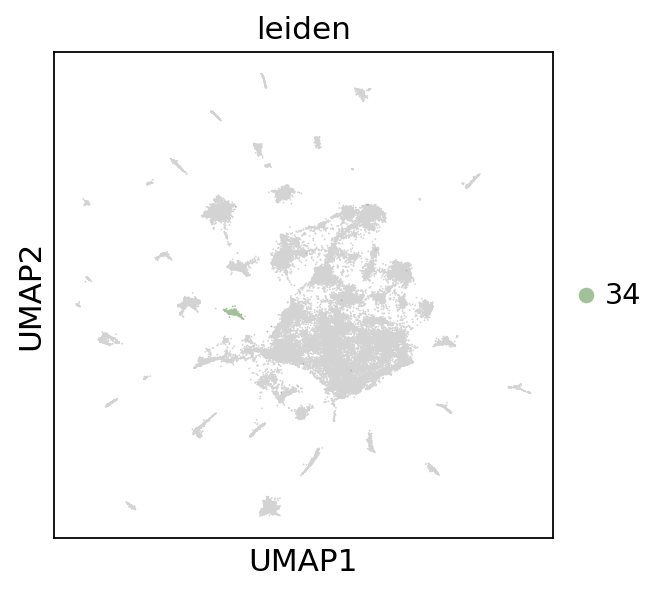

...

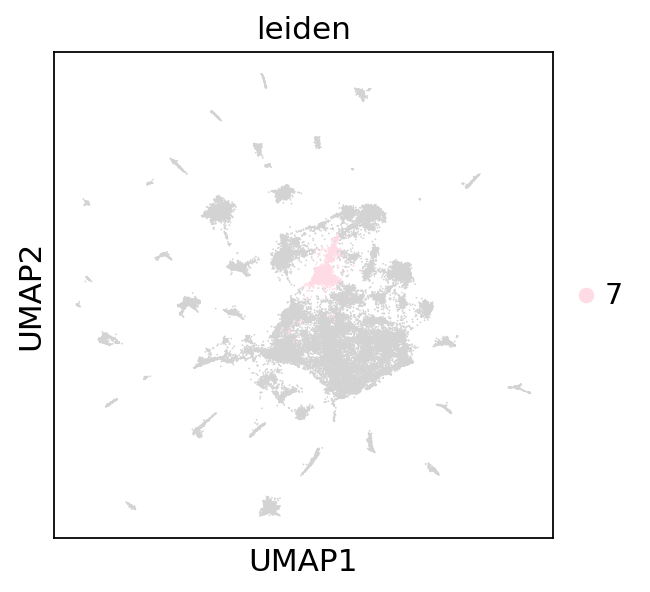

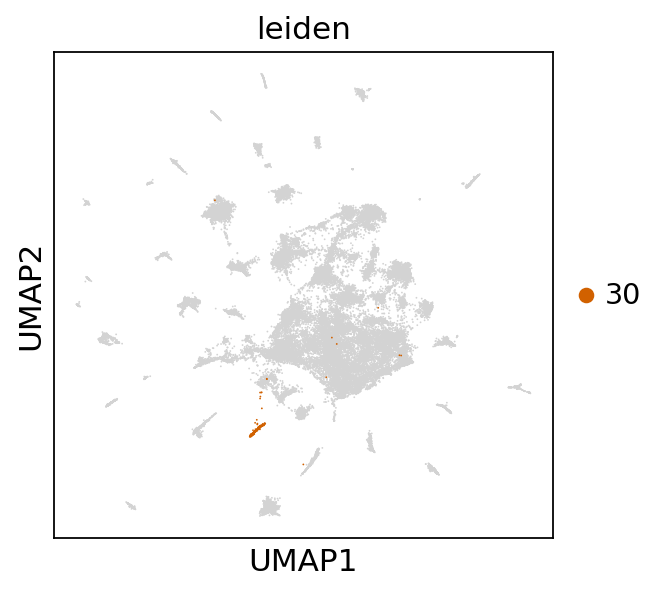

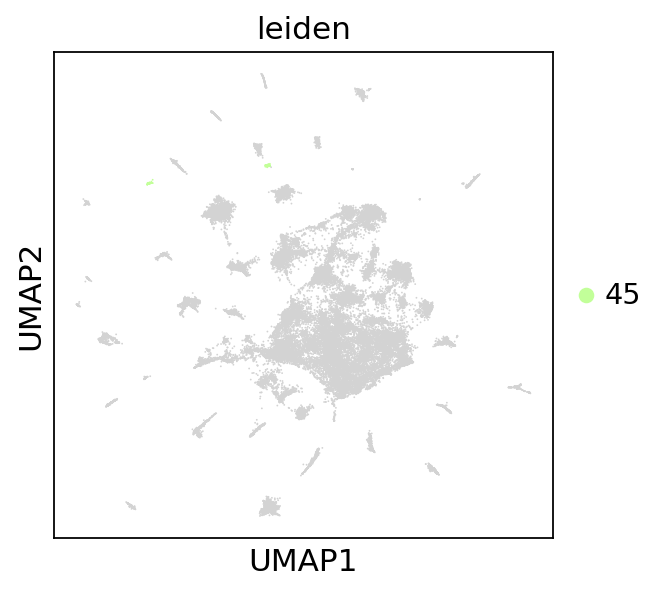

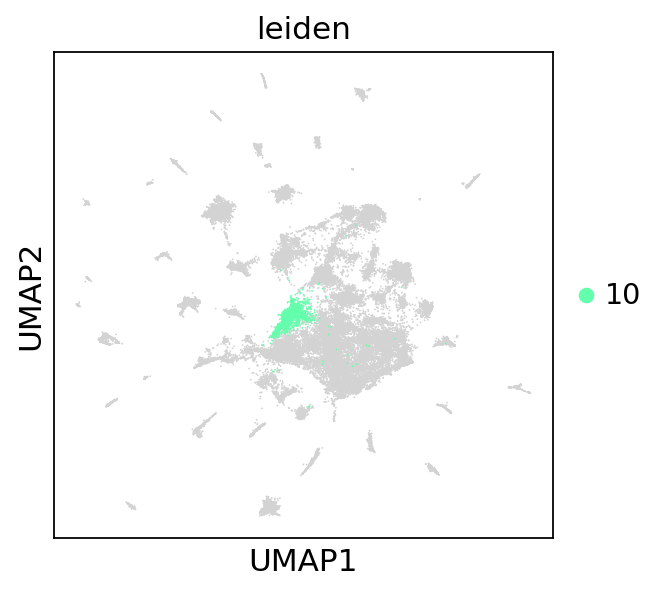

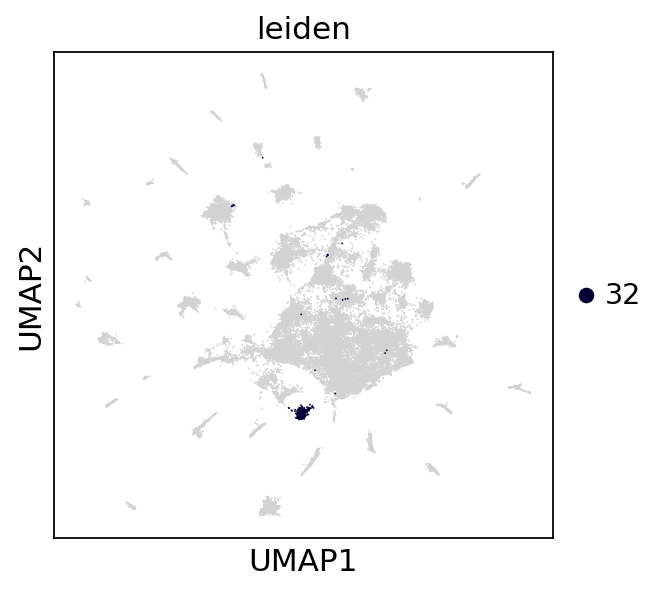

In [57]:
for cluster in set(uncorrected_umap.obs['leiden']):
    sc.pl.umap(uncorrected_umap, color='leiden',groups=[cluster])

# Distribution of Proliferation Markers

In [58]:
proliferation_markers = ['TOP2A','MKI67','TNFRSF9'] 

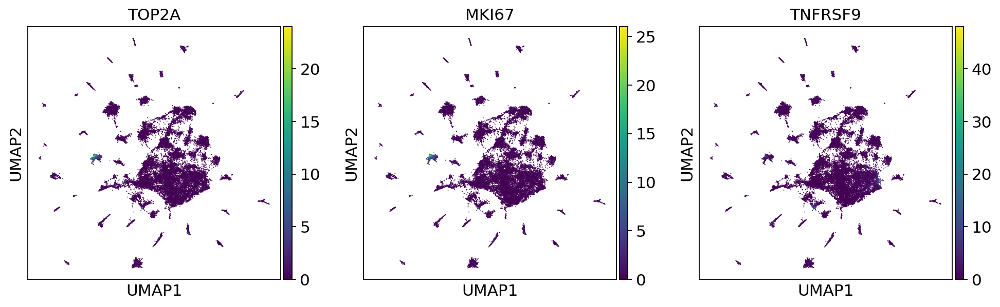

In [59]:
sc.pl.umap(uncorrected_umap,color=proliferation_markers)

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


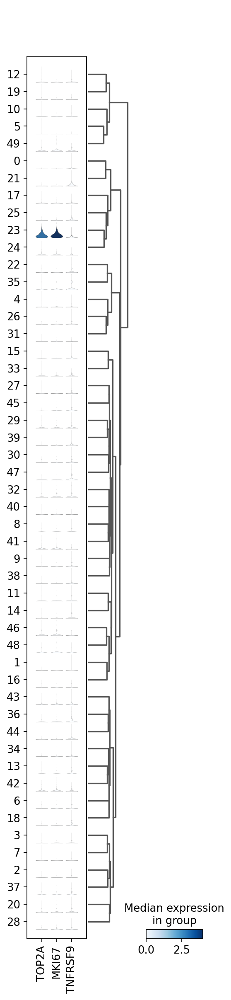

In [60]:
sc.pl.stacked_violin(uncorrected_umap, proliferation_markers, groupby='leiden', dendrogram=True)

# Distribution of Exhaustion Markers

In [61]:
exhaustion_markers = ['CXCL13','CTLA4','PDCD1','HAVCR2','TIGIT','BTLA','CD244','CD160','ICOS']

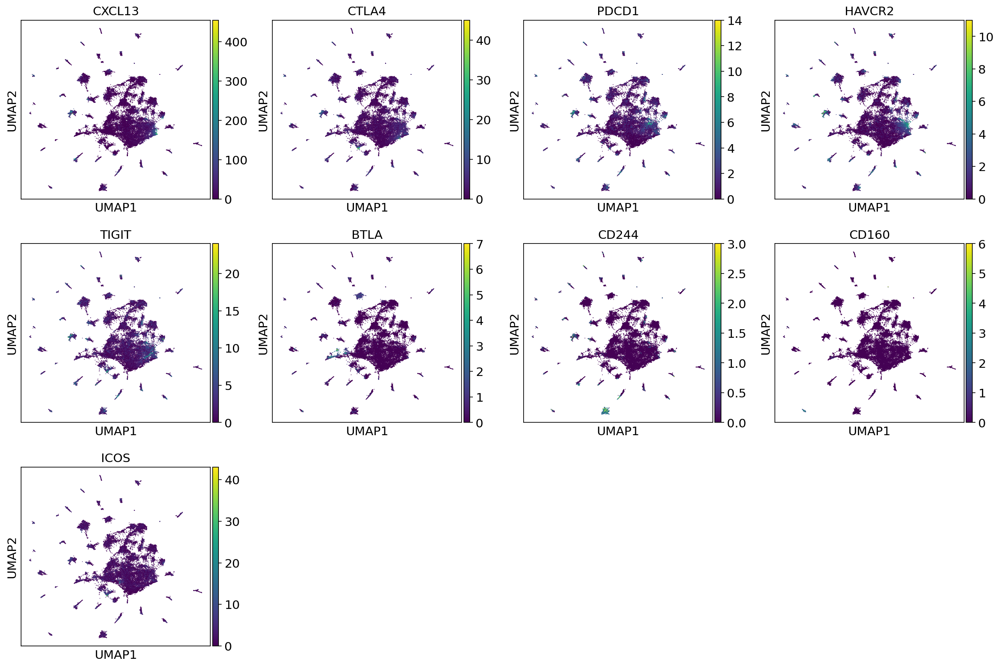

In [62]:
sc.pl.umap(uncorrected_umap,color=exhaustion_markers)

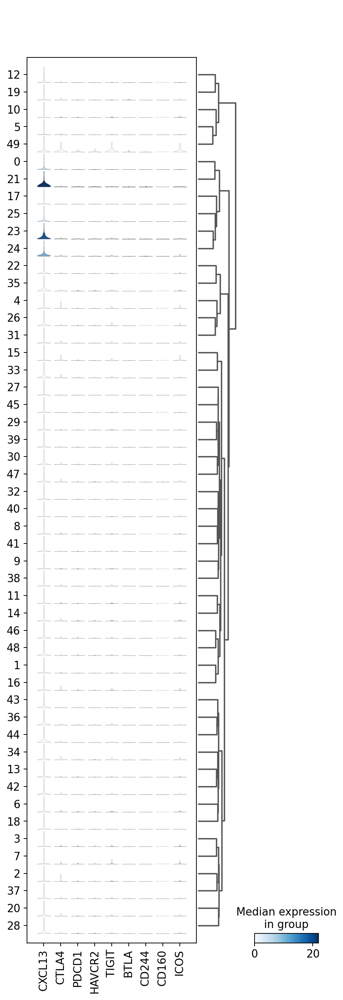

In [63]:
sc.pl.stacked_violin(uncorrected_umap, exhaustion_markers, groupby='leiden', dendrogram=True)

# Identifying the clusters

### Differential expression on all genes

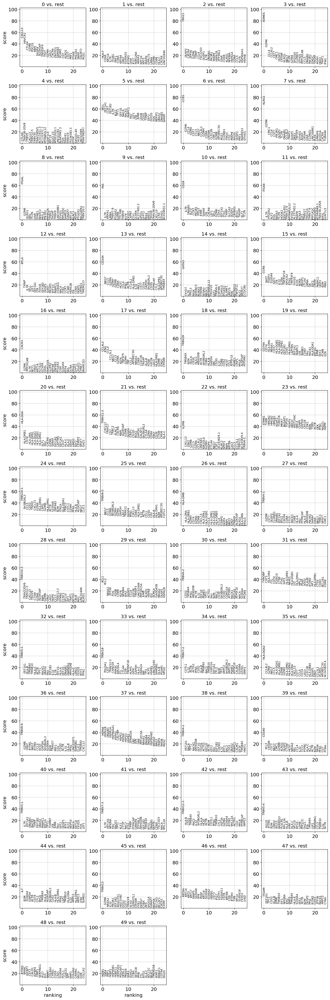

In [66]:
sc.pl.rank_genes_groups(uncorrected_umap,n_genes=25,use_raw=True)

### Differential Expression on highly variable genes plus chosen marker genes

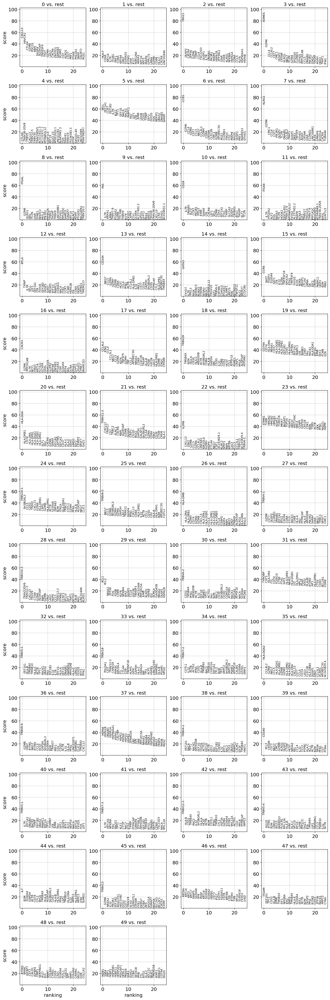

In [67]:
sc.pl.rank_genes_groups(uncorrected_umap,n_genes=25,use_raw=False)

In [65]:
cluster_marker_gene_file = '/scratch/cluster_genes.csv'

for i in range(len(set(uncorrected_umap.obs['leiden']))):
    with open(cluster_marker_gene_file, 'a') as file:
        file_writer = csv.writer(file)
        file_writer.writerow(['Cluster'+str(i)])
        file_writer.writerow(uncorrected_umap.uns['rank_genes_groups']['names'][str(i)][:30])

In [72]:
uncorrected_umap.uns['rank_genes_groups']['logfoldchanges'][str(3)][:30]

array([ 5.0430865 ,  3.3959098 ,  5.179678  ,  2.3524747 ,  0.98814845,
        1.1542653 ,  1.5035481 ,  0.63709444,  0.8668085 , -0.3998726 ,
        0.59000945, -1.0927343 ,  0.43018496,  0.5237556 ,  0.95025814,
        0.66377825, -0.8378672 ,  0.2147952 ,  0.31697488,  0.1853456 ,
        0.2654566 ,  0.5359285 ,  1.2708201 ,  0.19856101, -0.4325781 ,
        0.52330095,  0.7270736 ,  0.3596558 ,  0.36001682,  0.28122348],
      dtype=float32)